In [1]:
import numpy as np
import pandas as pd
import nltk
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from nltk import ngrams
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.sentiment import SentimentIntensityAnalyzer
from textblob import TextBlob
from textblob import classifiers
from datetime import datetime, timezone
import plotly.graph_objects as go
import itertools
from autocorrect import Speller
import re, string, timeit
%matplotlib inline

In [2]:
sightings = pd.read_pickle('sightings_add_UTC')
sightings.head(8)

,Date_Time,Shape,Duration,Summary,Posted,Detail_Link,Detail_Summary,Detail_Summary_nltk,Notes,Country,City,State,Location,Lat,Lon,timezone_str,Time_UTC
0,2021-04-23 06:30:00,Circle,9 minutes,Very strange ((NUFORC Note: Rocket launch f...,4/23/21,http://www.nuforc.org/webreports/162/S162815.html,\nVery strangeI have recorded a video of this ...,strangei recorded video sighting,NaN,United States,Blackshear,GA,"Blackshear, GA United States",31.304430,-82.240580,America/New_York,2021-04-23 10:30:00+00:00
1,2021-04-23 06:00:00,Circle,Seconds,Ball in the sky ((NUFORC Note: Rocket launc...,4/23/21,http://www.nuforc.org/webreports/162/S162814.html,\nBall in the skyObject appears as a white bal...,ball skyobject appears white ball vapor strewi...,NaN,United States,Thompson,VA,"Thompson, VA United States",37.781980,-79.974385,America/New_York,2021-04-23 10:00:00+00:00
2,2021-04-23 06:00:00,Light,5 minutes,I was driving and saw something strange in the...,4/23/21,http://www.nuforc.org/webreports/162/S162822.html,\nI was driving and saw something strange in t...,driving saw something strange sky pulled car i...,NaN,United States,Vero Beach,FL,"Vero Beach, FL United States",27.638850,-80.393960,America/New_York,2021-04-23 10:00:00+00:00
3,2021-04-23 05:59:00,Light,3 minutes,2 extremely bright lights appeared over east c...,4/23/21,http://www.nuforc.org/webreports/162/S162824.html,\n2 extremely bright lights appeared over east...,2 extremely bright light appeared east coast n...,NaN,United States,Saint Augustine,FL,"Saint Augustine, FL United States",29.894690,-81.314520,America/New_York,2021-04-23 09:59:00+00:00
4,2021-04-23 05:58:00,Cone,>5 minutes,A cone of light coming from the sky unlike any...,4/23/21,http://www.nuforc.org/webreports/162/S162819.html,\nA cone of light coming from the sky unlike a...,cone light coming sky unlike anything ever see...,NaN,United States,Durham,NC,"Durham, NC United States",35.995420,-78.896440,America/New_York,2021-04-23 09:58:00+00:00
5,2021-04-23 05:55:00,Sphere,10 minutes,Noticed a intense light that was covering a la...,4/23/21,http://www.nuforc.org/webreports/162/S162823.html,\nDriving on I-16 south and noticed a intense ...,driving i-16 south noticed intense light cover...,NaN,United States,I-16 south,GA,"I-16 south, GA United States",32.071949,-81.223154,America/New_York,2021-04-23 09:55:00+00:00
6,2021-04-23 05:54:00,Light,5 minutes,Two bright lights one flashing with a descendi...,4/23/21,http://www.nuforc.org/webreports/162/S162820.html,\nTwo bright lights one flashing with a descen...,two bright light one flashing descending expan...,NaN,United States,Parrish,FL,"Parrish, FL United States",27.577620,-82.425460,America/New_York,2021-04-23 09:54:00+00:00
7,2021-04-23 05:45:00,Light,~10-15 minutes,Im former military and have never seen aircraf...,4/23/21,http://www.nuforc.org/webreports/162/S162826.html,\nIm former military and have never seen aircr...,I former military never seen aircraft that.inc...,NaN,United States,Davenport,FL,"Davenport, FL United States",28.157990,-81.603400,America/New_York,2021-04-23 09:45:00+00:00


In [3]:
sightings.dtypes

Date_Time                   datetime64[ns]
Shape                               object
Duration                            object
Summary                             object
Posted                              object
Detail_Link                         object
Detail_Summary                      object
Detail_Summary_nltk                 object
Notes                               object
Country                             object
City                                object
State                               object
Location                            object
Lat                                float64
Lon                                float64
timezone_str                        object
Time_UTC               datetime64[ns, UTC]
dtype: object

In [4]:
#correcting 1900s to 2000s issue with date column
def fix_date(x):
    if x.year > 2021:
        return datetime(x.year - 100, x.month, x.day, x.hour, x.minute, x.second, x.microsecond, tzinfo=timezone.utc)
    else:
        return x
    

In [5]:
sightings['Time_UTC']=sightings['Time_UTC'].apply(fix_date)
sightings['Time_UTC']=pd.to_datetime(sightings['Time_UTC'], utc=True)
sightings.dtypes

Date_Time                   datetime64[ns]
Shape                               object
Duration                            object
Summary                             object
Posted                              object
Detail_Link                         object
Detail_Summary                      object
Detail_Summary_nltk                 object
Notes                               object
Country                             object
City                                object
State                               object
Location                            object
Lat                                float64
Lon                                float64
timezone_str                        object
Time_UTC               datetime64[ns, UTC]
dtype: object

In [6]:
sightings['Time_UTC']

0       2021-04-23 10:30:00+00:00
1       2021-04-23 10:00:00+00:00
2       2021-04-23 10:00:00+00:00
3       2021-04-23 09:59:00+00:00
4       2021-04-23 09:58:00+00:00
                   ...           
97243                         NaT
97244                         NaT
97247                         NaT
97248                         NaT
97249                         NaT
Name: Time_UTC, Length: 61647, dtype: datetime64[ns, UTC]

In [7]:
# creating the Bag of words Model
BagOfWords = []
for s in sightings['Detail_Summary_nltk']:
    s = re.sub(r' . ', " ", s)
    s = re.sub(r'[\(\)\[\]\^\$\+\*\.\?\/!@#%&{}\'\",;:]', "", s)
    words = nltk.word_tokenize(s)
    BagOfWords.append(words)

In [8]:
BagOfWords_series = pd.Series(BagOfWords) 

In [9]:
BagOfWords_list = ''.join(BagOfWords_series.str.join(',').tolist()).split(',')

In [10]:
#spell = Speller(lang='en')
#for word in BagOfWords_list:
#    spell(word)

In [11]:
ngram_counts = Counter(ngrams(BagOfWords_list, 3))
ngram_counts.most_common(10)

[(('bright', 'white', 'light'), 2431),
 (('never', 'seen', 'anything'), 2256),
 (('seen', 'anything', 'like'), 1771),
 (('high', 'rate', 'speed'), 1309),
 (('bright', 'orange', 'light'), 974),
 (('moving', 'across', 'sky'), 948),
 (('saw', 'bright', 'light'), 715),
 (('light', 'looked', 'like'), 704),
 (('looked', 'like', 'star'), 686),
 (('get', 'better', 'look'), 668)]

In [12]:
#Sentiment Analyzer
sia = SentimentIntensityAnalyzer()
out = sia.polarity_scores(sightings.Detail_Summary_nltk[2])
out

{'neg': 0.058, 'neu': 0.733, 'pos': 0.209, 'compound': 0.9402}

In [13]:
TextBlob(sightings.Detail_Summary_nltk[2]).sentiment

Sentiment(polarity=0.2067708333333333, subjectivity=0.50625)

In [14]:
def sentiment(summary) -> float:
    """Compound has a range of -1 (negative) to +1 (positive), if 0 then neutral"""
    scores = [sia.polarity_scores(sentence)["compound"] for sentence in nltk.sent_tokenize(summary)]
    try:
        return np.mean(scores)
    except:
        return 0

In [15]:
sightings['sentiment'] = sightings['Detail_Summary_nltk'].apply(sentiment)

/Users/daisy/opt/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [16]:
sightings['sentiment']

0        0.000000
1        0.202700
2        0.093769
3        0.130000
4       -0.030975
           ...   
97243   -0.085757
97244    0.101667
97247   -0.148122
97248    0.125829
97249    0.113256
Name: sentiment, Length: 61647, dtype: float64

In [17]:
#build a model
#training = [('so beautiful','pos'), 
#            ('They wanted to be friends','pos'),
#            ('never again', 'neg'),
#            ('The experience ruined my life','neg'),
#            ('the best thing I have even seen','pos'),
#            ('amazing','pos'),
#            ('I was scared and full of fear','neg'),
#            ('They were agressive and demanding','neg'),
#            ('I was abducted','neg')]
#testing = [('The colors were amazing','pos'), 
#           ('would never go there again','neg'),
#           ('life is so much better now','pos')]

In [18]:
#classifier = classifiers.NaiveBayesClassifier(training)

In [19]:
## decision tree classifier
#dt_classifier = classifiers.DecisionTreeClassifier(training)

In [20]:
#print (classifier.accuracy(testing))
#classifier.show_informative_features(3)

In [21]:
def TB_pos_neg(summary):
    scores = [TextBlob(sentence).sentiment[0] for sentence in nltk.sent_tokenize(summary)]
    try:
        return np.mean(scores)
    except:
        return 0

In [22]:
sightings['pos_neg'] = sightings['Detail_Summary_nltk'].apply(TB_pos_neg)

In [23]:
sightings.sample(8)

,Date_Time,Shape,Duration,Summary,Posted,Detail_Link,Detail_Summary,Detail_Summary_nltk,Notes,Country,City,State,Location,Lat,Lon,timezone_str,Time_UTC,sentiment,pos_neg
50556,2013-05-14 21:14:00,Unknown,1 minute,Bright star moving across the sky at very slow...,6/2/13,http://www.nuforc.org/webreports/098/S98049.html,\nBright star moving across the sky at very sl...,bright star moving across sky slow speedi outs...,NaN,United States,Tulsa,OK,"Tulsa, OK United States",36.150110,-95.993520,America/Chicago,2013-05-15 02:14:00+00:00,0.398200,0.066654
52469,2012-12-25 19:35:00,Sphere,12 minutes,Ten spheres flying in a line from north to sou...,2/4/13,http://www.nuforc.org/webreports/095/S95503.html,\nTen spheres flying in a line from north to s...,ten sphere flying line north south western sky...,NaN,United States,Livonia,MI,"Livonia, MI United States",42.396860,-83.369590,America/Detroit,2012-12-26 00:35:00+00:00,-0.113420,0.105833
70578,2010-02-07 21:15:00,Triangle,15 SECONDS,A loud black triangle with red lights seen in ...,2/14/10,http://www.nuforc.org/webreports/074/S74313.html,\nA loud black triangle with red lights seen i...,"loud black triangle red light seen cicero , il...",NaN,United States,Cicero,IL,"Cicero, IL United States",41.851200,-87.746730,America/Chicago,2010-02-08 03:15:00+00:00,0.113637,0.049236
18612,2017-11-19 20:00:00,Fireball,3 seconds,While traveling south on i75 near fl/ga line w...,11/22/17,http://www.nuforc.org/webreports/137/S137334.html,\nWhile traveling south on i75 near fl/ga line...,traveling south i75 near fl/ga line saw fireba...,NaN,United States,Grantsville,FL,"Grantsville, FL United States",40.599930,-112.466760,America/Denver,2017-11-20 03:00:00+00:00,-0.526700,0.133333
37075,2014-10-20 19:00:00,Light,3 minutes,All 5 of us saw the lights flash n fly along t...,11/6/14,http://www.nuforc.org/webreports/114/S114927.html,\nAll 5 of us saw the lights flash n fly along...,5 u saw light flash n fly along skyline ocean ...,NaN,United States,Surfside/Myrtle Beach,SC,"Surfside/Myrtle Beach, SC United States",33.608598,-78.976772,America/New_York,2014-10-20 23:00:00+00:00,-0.003475,0.109315
52720,2012-12-14 01:00:00,Disk,20 minutes,Bright lights appeared then object came toward...,12/20/12,http://www.nuforc.org/webreports/095/S95242.html,\nBright lights appeared then object came towa...,bright light appeared object came towards us.i...,NaN,United States,Fayetteville,NC,"Fayetteville, NC United States",35.055340,-78.877270,America/New_York,2012-12-14 06:00:00+00:00,0.059100,0.082857
13287,2019-04-21 23:00:00,Egg,Intermittent activity for,Hovering Light Over NC.,4/25/19,http://www.nuforc.org/webreports/145/S145805.html,\nHovering Light Over NCI have seen a UFO befo...,"hovering light nci seen ufo , never one moved ...",NaN,United States,Lexington,NC,"Lexington, NC United States",35.826230,-80.250730,America/New_York,2019-04-22 03:00:00+00:00,0.092043,0.100595
80073,2008-03-30 03:10:00,Fireball,3-5 sec,Two people witness high speed glowing sphere c...,3/31/08,http://www.nuforc.org/webreports/062/S62431.html,\nTwo people witness high speed glowing sphere...,two people witness high speed glowing sphere c...,Hancock (10 miles east),United States,Berkshire,MD,"Berkshire, MD United States",38.944000,-76.582190,None,NaT,0.175967,-0.017840


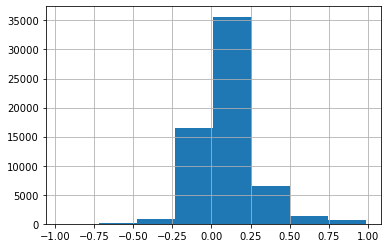

In [24]:
hist = sightings['sentiment'].hist(bins=8)

In [25]:
def objectivity(summary) -> float:
    """reports a float within the range [0.0, 1.0] where 0.0 is a very objective sentence and 1.0 is very subjective"""
    scores = [TextBlob(sentence).sentiment[1] for sentence in nltk.sent_tokenize(summary)]
    try:
        return np.mean(scores)
    except:
        return 0

In [26]:
sightings['objectivity'] = sightings['Detail_Summary_nltk'].apply(objectivity)

/Users/daisy/opt/anaconda3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


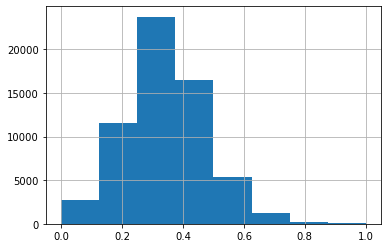

In [27]:
hist = sightings['objectivity'].hist(bins=8)

In [28]:
#save file
sightings.to_pickle('sightings_add_sentiment')

<AxesSubplot:>

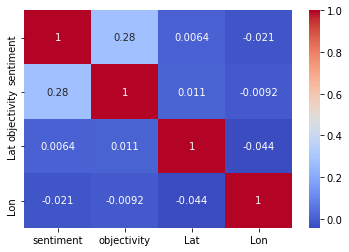

In [29]:
#load fresh file to work with
sightings_sentiment = pd.read_pickle('sightings_add_sentiment')

sns.heatmap(sightings_sentiment[['sentiment', 'objectivity', 'Lat', 'Lon']].corr(), annot = True, fmt='.2g',cmap= 'coolwarm') 

In [45]:
#visualize data

ufo_df = sightings_sentiment[['sentiment', 'objectivity', 'Lat', 'Lon', 'Time_UTC', 'City', 'State', 'Country', 'Shape', 'pos_neg']].copy()
ufo_df = ufo_df[ufo_df['Country'] == 'United States']
ufo_df.dropna(how='any', inplace=True)

# Set x axis, group y axis
ufo_df['year'] = ufo_df['Time_UTC'].dt.year
ufo_df['day'] = ufo_df['Time_UTC'].dt.dayofyear
ufo_df['hour'] = ufo_df['Time_UTC'].dt.hour


In [78]:
ufo_df['sentiment_D'] = ufo_df['sentiment']>0
ufo_df['sentiment_D']= ufo_df['sentiment_D'].astype(int)

In [79]:
ufo_df['objectivity_D'] = ufo_df['objectivity']>0.5
ufo_df['objectivity_D']=ufo_df['objectivity_D'].astype(int)

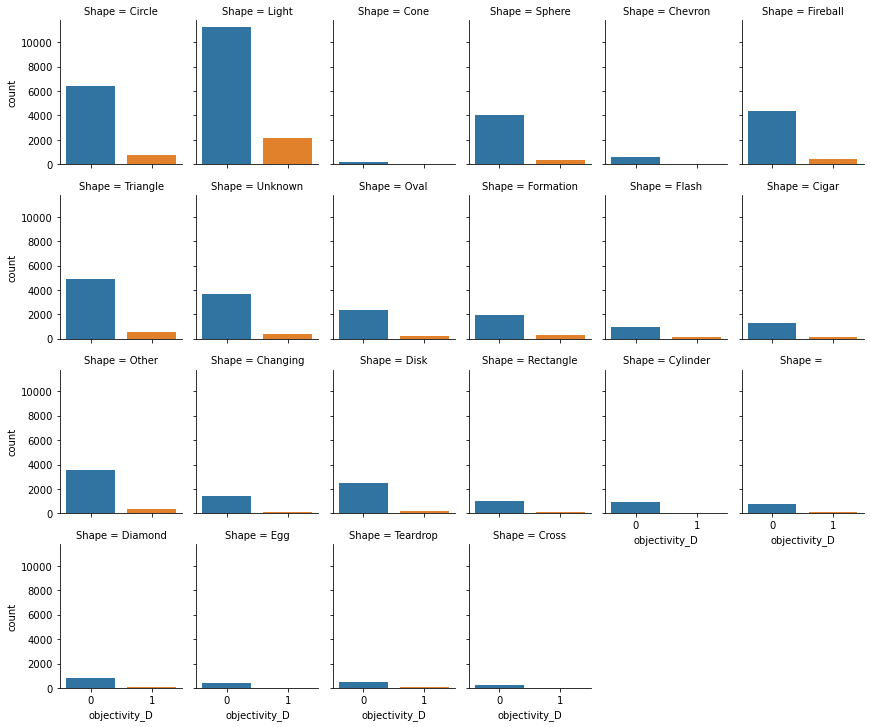

In [81]:
g = sns.catplot(x="objectivity_D", col="Shape", col_wrap=6,
                data=ufo_df,
                kind="count", height=2.5, aspect=.8)

In [61]:
ufo_df.iloc[[0]]

,sentiment,objectivity,Lat,Lon,Time_UTC,City,State,Country,Shape,pos_neg,year,day,hour
0,0.0,0.0,31.30443,-82.24058,2021-04-23 10:30:00+00:00,Blackshear,GA,United States,Circle,0.0,2021,113,10


In [32]:
ufo_df[ufo_df.year>2021]

,sentiment,objectivity,Lat,Lon,Time_UTC,City,State,Country,Shape,pos_neg,year,day


In [33]:
sightings.loc[[96009]]

,Date_Time,Shape,Duration,Summary,Posted,Detail_Link,Detail_Summary,Detail_Summary_nltk,Notes,Country,City,State,Location,Lat,Lon,timezone_str,Time_UTC,sentiment,pos_neg,objectivity
96009,2068-11-15 17:30:00,Sphere,10 minutes,It was November 1968 in Vernon Connecticut. I ...,1/31/20,http://www.nuforc.org/webreports/152/S152907.html,\nIt was November 1968 in Vernon Connecticut. ...,november 1968 vernon connecticut . 13 ... rece...,NaN,United States,Vernon,CT,"Vernon, CT United States",41.86753,-72.44806,America/New_York,1968-11-15 22:30:00+00:00,0.025417,0.06803,0.25088


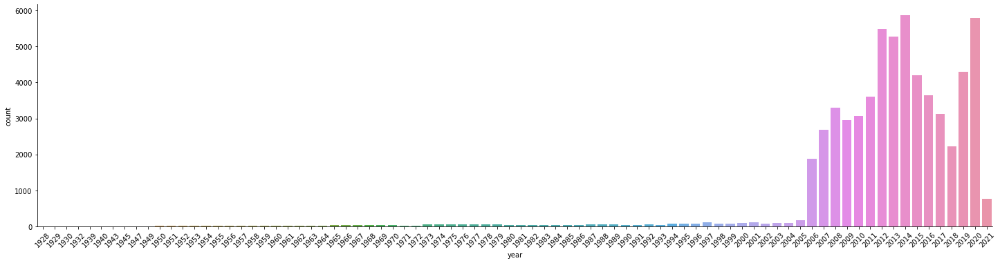

In [34]:
g = sns.catplot(x="year", kind = 'count', data = ufo_df, height=5, aspect=4)
g.set_xticklabels(rotation=45)

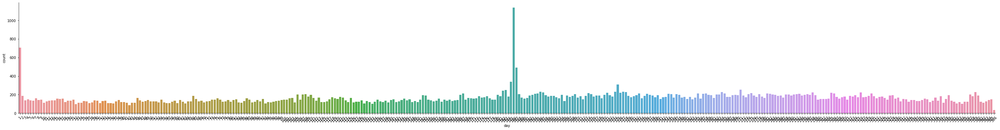

In [55]:
g = sns.catplot(x="day", kind = 'count', data = ufo_df, height=5, aspect=8)
g.set_xticklabels(rotation=45)

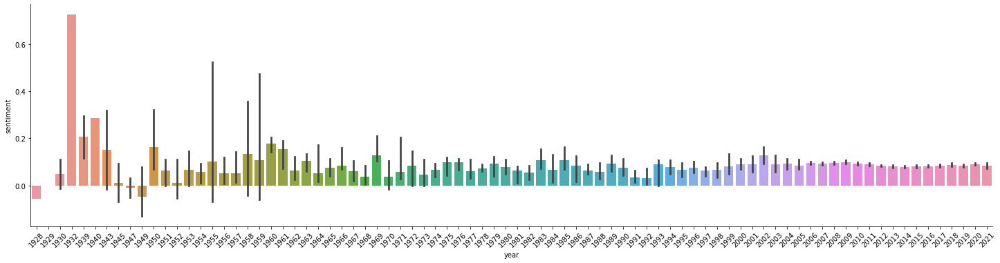

In [64]:
g = sns.catplot(x="year", y="sentiment", estimator= np.median ,kind="bar", data=ufo_df, height=5, aspect=4)
g.set_xticklabels(rotation=45)

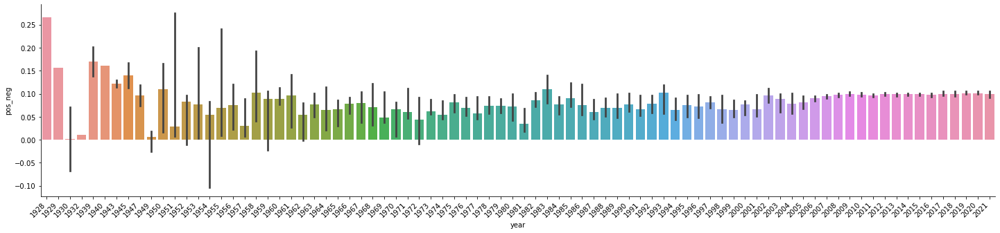

In [65]:
g = sns.catplot(x="year", y="pos_neg", estimator= np.median ,kind="bar", data=ufo_df, height=5, aspect=4)
g.fig.autofmt_xdate()
g.set_xticklabels(rotation=45)

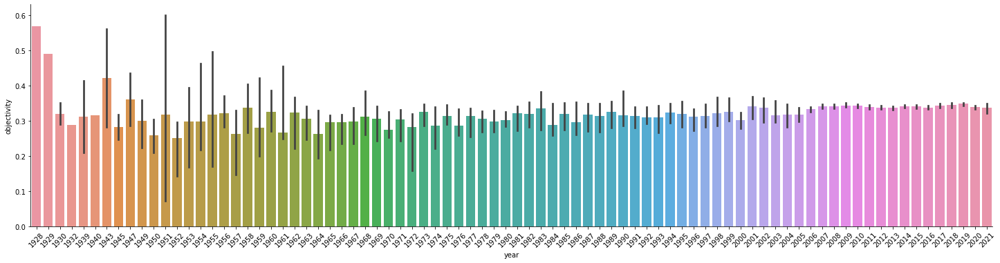

In [66]:
g = sns.catplot(x="year", y="objectivity", estimator= np.median ,kind="bar", data=ufo_df, height=5, aspect=4)
g.set_xticklabels(rotation=45)

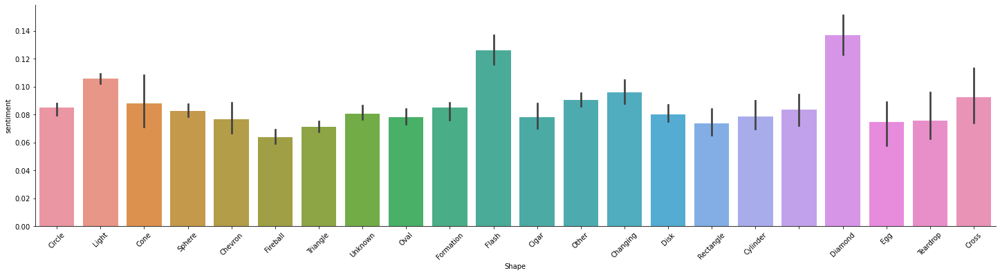

In [83]:
g = sns.catplot(x="Shape", y="sentiment", estimator= np.median ,kind="bar", data=ufo_df, height=5, aspect=4)
g.set_xticklabels(rotation=45)

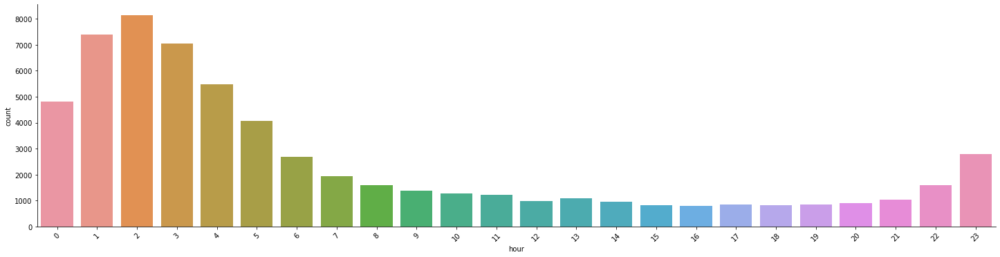

In [52]:
g = sns.catplot(x="hour", kind = 'count', data = ufo_df, height=5, aspect=4)
g.set_xticklabels(rotation=45)

In [37]:
#define borders for map
#BBox = ((ufo_df.Lon.min(),   ufo_df.Lon.max(), ufo_df.Lat.min(), ufo_df.Lat.max()))

BBox = (-125.859, -92.681, 25.562, 49.781)

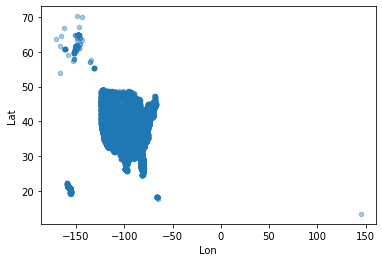

In [38]:
ufo_df.plot(kind="scatter", x="Lon", y="Lat", alpha=0.4)
plt.show()

In [39]:
#ruh_m = plt.imread('map2.png')

In [40]:
#fig, ax = plt.subplots(figsize = (8,7))
#ax.scatter(x=ufo_df.Lon, y=ufo_df.Lat, zorder=1, alpha= 0.2, c='b', s=10)

#ax.set_title('UFO Sightings in US')
#ax.set_xlim(BBox[0],BBox[1])
#ax.set_ylim(BBox[2],BBox[3])
#ax.imshow(ruh_m, zorder=0, extent = BBox, aspect= 'equal')

In [41]:
fig = go.Figure(data=go.Scattergeo(
        lon = ufo_df['Lon'],
        lat = ufo_df['Lat'],
        text = ufo_df['Shape'],
        mode = 'markers',
        marker = dict(
                    color = ufo_df['pos_neg'],
                    reversescale = False,
                    opacity = 0.7,
                    size = 2,
                    colorbar = dict(
                                titleside = "right",
                                outlinecolor = "rgba(0, 68, 68, 0)",
                                ticks = "outside",
                                showticksuffix = "last",
                                dtick = 1
        ))))

fig.update_layout(
        title = 'UFO sightings in the US by sentiment',
        geo_scope='usa',
    )
fig.show()